In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2 as cv
from sklearn.model_selection import train_test_split
import os

# EDA

In [2]:
data_training = pd.read_csv('../../dataset/track1/training/driving_log.csv', names=['center', 'left', 'right', 'steering', 'throttle', 'brake', 'speed'])
# data_validation = pd.read_csv('../../dataset/track1/validation/driving_log.csv', names=['center', 'left', 'right', 'steering', 'throttle', 'brake', 'speed'])
data_validation = pd.read_csv('../../archive/dataset/dataset/driving_log.csv', names=['center', 'left', 'right', 'steering', 'throttle', 'brake', 'speed'])
data_training.head()

,center,left,right,steering,throttle,brake,speed
0,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,0.0,0.0,0,0.000005
1,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,0.0,0.0,0,0.000004
2,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,0.0,0.0,0,0.000024
3,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,0.0,0.0,0,0.000005
4,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,/mnt/HDD/Programs/Python/SelfDrivingCar/datase...,0.0,0.0,0,0.000006


In [3]:
data_training.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3450 entries, 0 to 3449
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   center    3450 non-null   object 
 1   left      3450 non-null   object 
 2   right     3450 non-null   object 
 3   steering  3450 non-null   float64
 4   throttle  3450 non-null   float64
 5   brake     3450 non-null   int64  
 6   speed     3450 non-null   float64
dtypes: float64(3), int64(1), object(3)
memory usage: 188.8+ KB


In [4]:
images_center = data_training['center']
images_center = [cv.imread(img_path) for img_path in images_center]
images_center = [cv.cvtColor(img, cv.COLOR_BGR2RGB) for img in images_center]

In [5]:
images_center[0].shape

(160, 320, 3)

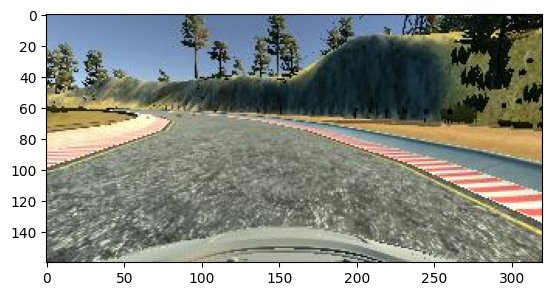

In [6]:
plt.imshow(images_center[0])

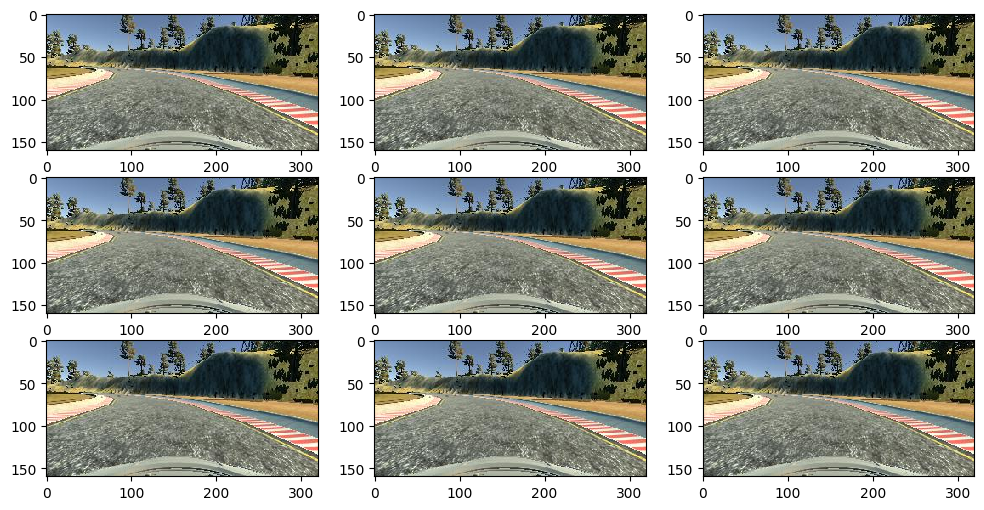

In [7]:
w = 320
h = 160

fig = plt.figure(figsize=(12, 6))
columns = 3
rows = 3

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    plt.imshow(images_center[i], interpolation='nearest')
plt.show()

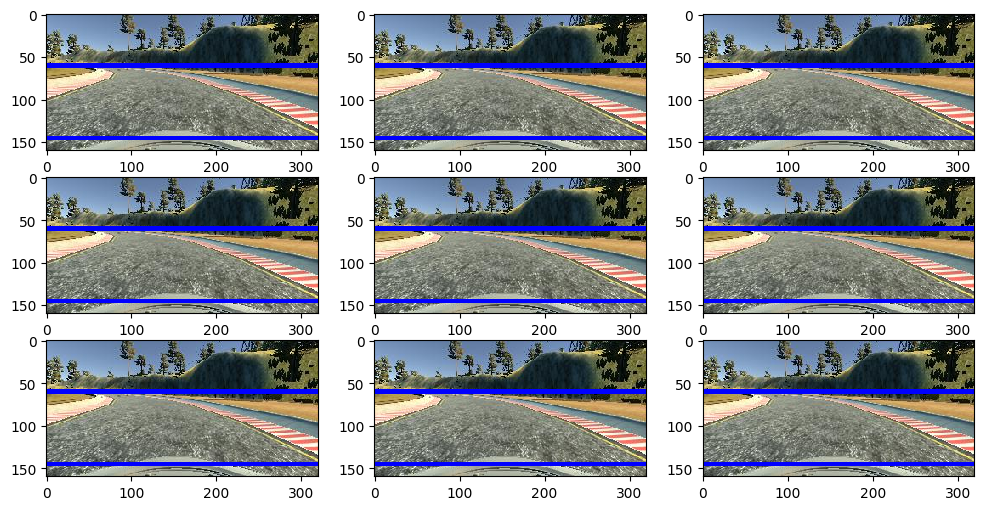

In [8]:
w = 320
h = 160

fig = plt.figure(figsize=(12, 6))
columns = 3
rows = 3

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    img = images_center[i]
    img = cv.line(img, (0, 60), (320, 60), (0, 0, 255), 4)
    img = cv.line(img, (0, 145), (320, 145), (0, 0, 255), 4)
    plt.imshow(img, interpolation='nearest')
plt.show()

In [9]:
images_center_cropped = [img[60:145, 0:320] for img in images_center]

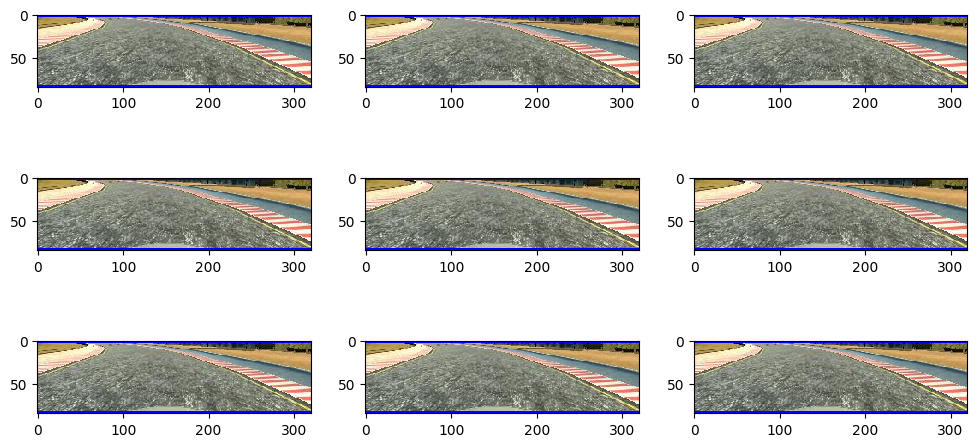

In [10]:

# visualize cropped images
w = 320
h = 160

fig = plt.figure(figsize=(12, 6))
columns = 3
rows = 3

for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    plt.imshow(images_center_cropped[i], interpolation='nearest')
plt.show()

In [11]:
# cropped video
video = cv.VideoWriter('../../data/video.avi', cv.VideoWriter_fourcc(*'DIVX'), 20, (320, 100))
for img in images_center_cropped:
    video.write(img)

[ WARN:0@144.827] global cap.cpp:643 open VIDEOIO(CV_IMAGES): raised OpenCV exception:

OpenCV(4.10.0) /io/opencv/modules/videoio/src/cap_images.cpp:430: error: (-215:Assertion failed) !filename_pattern.empty() in function 'open'




In [12]:
X_training = data_training[['center', 'left', 'right']].values
y_training = data_training['steering']

X_validation = data_validation[['center', 'left', 'right']].values
y_validation = data_validation['steering']

In [13]:
images_training = []
steering_values_training = []
for i in range(len(X_training)):
    center, left, right = X_training[i]
    images_training.append(cv.imread(center))
    images_training.append(cv.imread(left))
    images_training.append(cv.imread(right))
    steering_values_training.append(y_training[i])
    steering_values_training.append(y_training[i] + 0.2)
    steering_values_training.append(y_training[i] - 0.2)


In [ ]:
path = '/mnt/HDD/Programs/Python/SelfDrivingCar/archive/dataset/dataset/IMG/'
images_validation = []
steering_values_validation = []
for i in range(len(X_validation)):
    center, left, right = X_validation[i]
    images_validation.append(cv.imread(path + center.replace('\\', '/').split('/')[-1]))
    images_validation.append(cv.imread(path + left.replace('\\', '/').split('/')[-1]))
    images_validation.append(cv.imread(path + right.replace('\\', '/').split('/')[-1]))
    steering_values_validation.append(y_validation[i])
    steering_values_validation.append(y_validation[i] + 0.2)
    steering_values_validation.append(y_validation[i] - 0.2)

In [28]:
images_validation = []
steering_values_validation = []
for i in range(len(X_validation)):
    center, left, right = X_validation[i]
    images_validation.append(cv.imread(center))
    images_validation.append(cv.imread(left))
    images_validation.append(cv.imread(right))
    steering_values_validation.append(y_validation[i])
    steering_values_validation.append(y_validation[i])
    steering_values_validation.append(y_validation[i])

[ WARN:0@833.204] global loadsave.cpp:241 findDecoder imread_('Desktop\track1data\IMG\center_2019_04_02_19_25_33_671.jpg'): can't open/read file: check file path/integrity
[ WARN:0@833.204] global loadsave.cpp:241 findDecoder imread_('Desktop\track1data\IMG\left_2019_04_02_19_25_33_671.jpg'): can't open/read file: check file path/integrity
[ WARN:0@833.204] global loadsave.cpp:241 findDecoder imread_('Desktop\track1data\IMG\right_2019_04_02_19_25_33_671.jpg'): can't open/read file: check file path/integrity
[ WARN:0@833.204] global loadsave.cpp:241 findDecoder imread_('Desktop\track1data\IMG\center_2019_04_02_19_25_33_743.jpg'): can't open/read file: check file path/integrity
[ WARN:0@833.205] global loadsave.cpp:241 findDecoder imread_('Desktop\track1data\IMG\left_2019_04_02_19_25_33_743.jpg'): can't open/read file: check file path/integrity
[ WARN:0@833.205] global loadsave.cpp:241 findDecoder imread_('Desktop\track1data\IMG\right_2019_04_02_19_25_33_743.jpg'): can't open/read file: 

In [18]:
for i in range(len(images_training)):
    images_training[i] = cv.cvtColor(images_training[i], cv.COLOR_BGR2RGB)
    images_training[i] = images_training[i][60:145, 0:320]

In [16]:
for i in range(len(images_validation)):
    images_validation[i] = cv.cvtColor(images_validation[i], cv.COLOR_BGR2RGB)
    images_validation[i] = images_validation[i][60:145, 0:320]

error: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [ ]:
images_training = np.array(images_training)
steering_values_training = np.array(steering_values_training)
print("Images shape: ", images_training.shape)
print("Steering values shape: ", steering_values_training.shape)

Images shape:  (10350, 85, 320, 3)
Steering values shape:  (10350,)


In [ ]:
images_validation = np.array(images_validation)
steering_values_validation = np.array(steering_values_validation)
print("Images shape: ", images_validation.shape)
print("Steering values shape: ", steering_values_validation.shape)

Images shape:  (2703, 85, 320, 3)
Steering values shape:  (2703,)


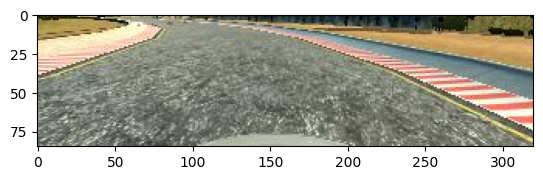

In [ ]:
plt.imshow(images_training[0])

In [ ]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

In [ ]:
def ModelNvidia():
    model = Sequential()
    model.add(Conv2D(24, (5, 5), strides=(2,2), input_shape=(85, 320, 3), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2,2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2,2), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    model.add(Dropout(0.5))
    model.add(Dense(50, activation='elu'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='elu'))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=1e-4), loss='mse')
    return model

In [ ]:
model = ModelNvidia()
model.summary()

/mnt/HDD/Programs/Python/SelfDrivingCar/project-2/carenv/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 41, 158, 24)    │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 19, 77, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 8, 37, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 6, 35, 64)      │        27,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 4, 33, 64)      │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 4, 33, 64)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8448)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 100)            │       844,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 981,819 (3.75 MB)

 Trainable params: 981,819 (3.75 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(images_training, steering_values_training, batch_size=32, epochs=30, validation_split=0.2, verbose=1, shuffle=1)
# history = model.fit(images_training, steering_values_training, batch_size=32, epochs=30, validation_data=(images_validation, steering_values_validation), verbose=1, shuffle=1)

Epoch 1/30
259/259 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.1181 - val_loss: 0.0877
Epoch 2/30
259/259 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 0.1227 - val_loss: 0.0875
Epoch 3/30
259/259 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 0.1126 - val_loss: 0.0878
Epoch 4/30
259/259 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.1142 - val_loss: 0.0877
Epoch 5/30
259/259 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.1126 - val_loss: 0.0876
Epoch 6/30
259/259 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.0999 - val_loss: 0.0875
Epoch 7/30
259/259 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.1060 - val_loss: 0.0877
Epoch 8/30
259/259 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.1016 - val_loss: 0.0875
Epoch 9/30
259/259 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.1013 - val_loss: 0.0875
Epoch 10/30
259/259 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.0943 - val_loss: 0.0876
Epoch 11/30
259/259 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 0.1025 - val_loss: 0.0877
Epoch 12/30
259/259 ━━━━━━━━━━━━━━━━━━━━

Text(0.5, 0, 'Epoch')

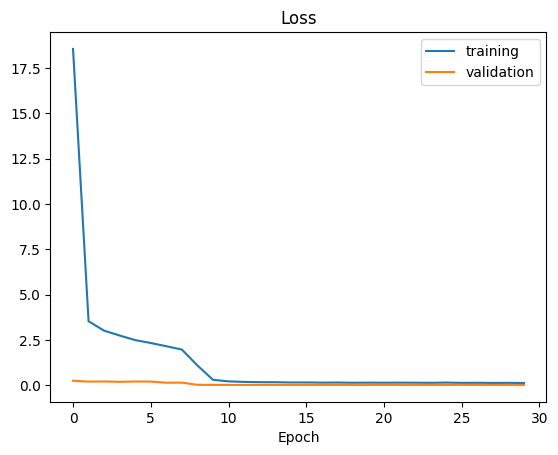

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('model1.keras')

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
m = load_model("model1.keras")

In [ ]:
prediction = m.predict(images_validation)

85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [ ]:
accuracy = np.mean(np.abs(prediction - steering_values_validation) < 0.1)
print(accuracy)

0.8412874583795783
